In [1]:
!pip install Unidecode
!pip install fuzzysearch

!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls


# Sorting lines based on the xml files

In [2]:
from sort_xml import *
base_dir = '../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

### Load pdf and xml example 

In [4]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +25

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188
PMC1247189
PMC1247474
PMC1247478
PMC1247480
PMC1247485
PMC1247515
PMC1247517
PMC1247523
PMC1247562
PMC1247569
PMC1247570
PMC1247573
PMC1247606
PMC1247607
PMC1247608
PMC1247616
PMC1247620
PMC1247625
PMC1247658
PMC1247661


In [3]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1808441/

1748-7161-2-3-1.gif  1748-7161-2-3-2.jpg  1748-7161-2-3-S1.pdf
1748-7161-2-3-1.jpg  1748-7161-2-3-3.gif  1748-7161-2-3.nxml
1748-7161-2-3-2.gif  1748-7161-2-3-3.jpg  1748-7161-2-3.pdf


In [ ]:
PMC1247562 # exellent
PMC1247569 # exell b-37 --> (now ok)
PMC1247570 # title twice b-16, b-23
PMC1247573 # front, body et tables perfect (t0-(3,4), t5-(4,10,15,20)) 'Yes'/'No'
PMC1247606 # between b-7 and b-8, two missing nodes in the xml
PMC1247607 # body et tables perfect (t0-1, t0-1-1 et t0-1-3 --> same tb, No.% No.%, first No.%)
PMC1247608 # erreur de parser sur table t1-1, body trop long (beaucoup de tbs)
PMC1247616
PMC1280340 # body et tables perfect
PMC1247620 # 6min trop long
PMC1247625 # perfect (0 table)
PMC1247658 # 3min



1

In [411]:
file_dir = base_dir + 'xmls/PMC1247515'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247515/ehp0112-001269.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247515/ehp0112-001269.pdf


## Model extractor

2

In [448]:
from edspdf import Pipeline
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# model
model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

dict_page_text_boxes = {}
for tb in doc.content_boxes:
    if tb.page_num not in dict_page_text_boxes:
        dict_page_text_boxes[tb.page_num] = []
    dict_page_text_boxes[tb.page_num].append(tb)
print(f'Nb pages {len(dict_page_text_boxes)}')
# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

Nb pages 6


#### Display XML

3

In [449]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)
# root = tree.getroot()

printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">15345338</article-id>
      <article-id pub-id-type="pmc">1247515</article-id>
    

#### Font, Body and tables text nodes

##### Front nodes matching

4

In [450]:
xml_front_nodes = get_front_nodes(tree)

print(f'\n\nNb nodes {len(xml_front_nodes)}')
for id,xml_node in enumerate(xml_front_nodes):
    printXML(xml_node)

front_nodes = []
for id,xml_node in enumerate(xml_front_nodes):
    node = Node(xml_node, id, color='yellow', bg_color='black', r0='f', entropie_threshold=0.1, type='front')
    front_nodes.append(node)
    
front_nodes = tqdm(front_nodes, mininterval=1)



Nb nodes 5
<article-title xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">The Science and Practice of Carcinogen Identification and Evaluation</article-title>

<contrib-groups>
  <new-name>
    <given-names>Vincent James</given-names>
    <surname>Cogliano</surname>
  </new-name>
  <new-name>
    <given-names>Robert A.</given-names>
    <surname>Baan</surname>
  </new-name>
  <new-name>
    <given-names>Kurt</given-names>
    <surname>Straif</surname>
  </new-name>
  <new-name>
    <given-names>Yann</given-names>
    <surname>Grosse</surname>
  </new-name>
  <new-name>
    <given-names>Marie Béatrice</given-names>
    <surname>Secretan</surname>
  </new-name>
  <new-name>
    <given-names>Fatiha El</given-names>
    <surname>Ghissassi</surname>
  </new-name>
  <new-name>
    <given-names>Paul</given-names>
    <surname>Kleihues</surname>
  </new-name>
</contrib-groups>

<affs>
  <aff>International Agency for Research on Cancer, Lyon, France</

  0%|          | 0/5 [00:00<?, ?it/s]

5 ---> rematch 1

In [454]:
for tb in doc.content_boxes:
    tb.rank = None
    tb.inode = None

6

In [455]:
for node in front_nodes:
    node.reset()

get_matches(front_nodes, dict_page_text_boxes, v=False)

7

In [456]:
n_tt = len(front_nodes)
n_mt = len([0 for node in front_nodes if node.full])
print(f'Front\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in front_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Front
  Nb nodes total 5
  Nb nodes matched 5
  Nb nodes not matched 0


In [419]:
# id = 0
# for node in front_nodes:
#     if node.id == id:
#         break

# node.print_node()

##### Body nodes matching

8 --> one execution

In [457]:
# executer une seule fois sionon erreur
# moins de noeuds retournes

qbody='//body//title | //body//p'
r = elementpath.select(tree, qbody)
r2 = []

jump = False
for i,node in enumerate(r):
    if jump:
        jump = False
        continue
    if node.tag == 'title' and r[1+i].tag == 'p':
        sec = etree.Element('sec')
        sec.append(node)
        sec.append(r[1+i])
        r2.append(sec)
        jump = True
    else:
        r2.append(node)

xml_body_nodes = r2

body_nodes = []
for id, xml_node in enumerate(xml_body_nodes):
    node = Node(xml_node, id, color='black', bg_color='cyan', r0='b', type='body')
    body_nodes.append(node)
body_nodes = tqdm(body_nodes, mininterval=1)

  0%|          | 0/100 [00:00<?, ?it/s]

9

In [458]:
for node in body_nodes:
    node.reset()

get_matches(body_nodes, dict_page_text_boxes, v=False)

100%|██████████| 100/100 [00:02<00:00, 40.97it/s]


10

In [459]:
n_tt = len(body_nodes)
n_mt = len([0 for node in body_nodes if node.full])
print(f'Body\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for node in body_nodes:
    if not node.full:
        print(f'    {node.id}  `{node.text}`')

Body
  Nb nodes total 100
  Nb nodes matched 99
  Nb nodes not matched 1
    4  `The U.S. Environmental Protection Agency (EPA) assesses the health hazards of chemical contaminants present in the environment. These assessments cover cancer and adverse effects other than cancer. The hazard assessments are coupled with dose-response assessments that the U.S. EPA uses in its regulatory and information programs. The principles that the U.S. EPA uses in its cancer assessments are discussed in an evolving series of guidelines ( U.S. EPA 1986 
 U.S. EPA 1999 
 U.S. EPA 2003 ). Chemical assessments are developed through a process that includes a toxicologic review of the pertinent scientific literature written by U.S. EPA scientists or contractors, internal and external peer reviews, and an internal consensus review ( U.S. EPA 2004 ).`


Introduction

Contex
Datset
Model


11 --> copy

In [460]:
inode_copy = []
for tb in doc.content_boxes:
    inode_copy.append(tb.inode)

In [424]:
# id = 4
# for node in body_nodes:
#     if node.id == id: break
# printXML(node.xml_node)
# node.print_node()

In [425]:
# tbs = []
# for tb in doc.content_boxes:
#     if tb.inode is None and tb.page_num == 2:
#         print(f'`{tb.text}` {tb}')
#         tbs.append(tb)
# tb = tbs[1]

# print(f'\n`{tb.text}` {tb}')

In [426]:

# delete_white_spaces(unidecode(" ".join(node.xml_node.itertext()))), \
# delete_white_spaces(unidecode(tb.text))

##### Tables nodes matching

12 --> one execution

In [461]:
# one execution

qtables='//table-wrap'
tables_nodes=elementpath.select(tree, qtables)


qtable='//label | //caption | //tr | //table-wrap-foot'
xml_table_nodes = [
    [
        node for node in one_tns if "".join(node.itertext()) != ""
    ]
    for one_tns in [elementpath.select(table_tree, qtable) for table_tree in tables_nodes]
]

# Merging label and caption
for itable in range(len(xml_table_nodes)):
    label = None
    caption = None
    lc = None
    for ind,node in enumerate(xml_table_nodes[itable]):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            xml_table_nodes[itable][label[0]] = lc
            xml_table_nodes[itable] = xml_table_nodes[itable][:caption[0]] + xml_table_nodes[itable][1+caption[0]:]
            break

# delete other label tags
table_nodes_ = []
for table in xml_table_nodes:
    tk_nodes = []
    for node in table:
        if node.tag != 'label':
            tk_nodes.append(node)
    table_nodes_.append(tk_nodes)
    
xml_table_nodes = table_nodes_

table_nodes = []
for itable,xml_t in enumerate(xml_table_nodes):
    t_nodes = []
    for id,xml_node in enumerate(xml_t):
        node = Node(xml_node, id, color='red', bg_color='white', r0=f't{itable}-', type='table')
        t_nodes.append(node)
    t_nodes = tqdm(t_nodes, mininterval=1)
    table_nodes.append(t_nodes)

  0%|          | 0/16 [00:00<?, ?it/s]

In [428]:
# itable = 0
# print(f'Nb nodes of table {itable}: {len(xml_table_nodes[itable])}\n')
# for inode,node in enumerate(xml_table_nodes[itable]):
#     print(f'{node.tag} {inode}\n  `{" | ".join(node.itertext())}`\n')
#     # printXML(node)
#     print('------------------')

13 --> backup

In [429]:
# backup tb.inode
for tb,inode in zip(doc.content_boxes, inode_copy):
    tb.inode = inode
    if inode is None:
        tb.rank = None

14

In [462]:

# for ic,tb in zip(inode_copy,doc.content_boxes):
#     tb.inode = ic
for t_nodes in table_nodes:
    for node in t_nodes:
        node.reset()
    
    get_matches(t_nodes, dict_page_text_boxes, v=False)

# itable = 0
# _tdb = get_matches(table_nodes[itable], dict_page_text_boxes, color='red', bg_color='white',v=False, r0=f't{itable}-')

100%|██████████| 16/16 [00:03<00:00,  4.03it/s]


15

In [463]:
print(f'Nb tables {len(table_nodes)}')
for itable in range(len(table_nodes)):
    # itable = 0
    
    tk_nodes = table_nodes[itable]
    # tk_nodes_blocs, tk_dict_blocs = _tdb    #   table_dict_blocks[itable]

    n_tt = len(tk_nodes)
    n_mt = len([0 for node in tk_nodes if node.full])
    print(f'Table {itable}\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
    for node in tk_nodes:
        if not node.full:
            print(f'    {node.id}  `{node.text}`')
    
    # break

Nb tables 1
Table 0
  Nb nodes total 16
  Nb nodes matched 16
  Nb nodes not matched 0


In [438]:
# inode never matched fails because therefore inode not in _dict_blocs
itable = 0
id = 4
tk_nodes = table_nodes[itable]

# tk_nodes_blocs, tk_dict_blocs = _tdb    #  table_dict_blocks[itable]# 
for node in tk_nodes:
    if node.id == id: break

node.print_node()

Nb blocs 0
Node (4 not complete) text: ` Draft sections 2-4 x x`


In [439]:
tb_match_('X', ' Draft sections 2-4 x x')

False

#### Ranked text boxes

16

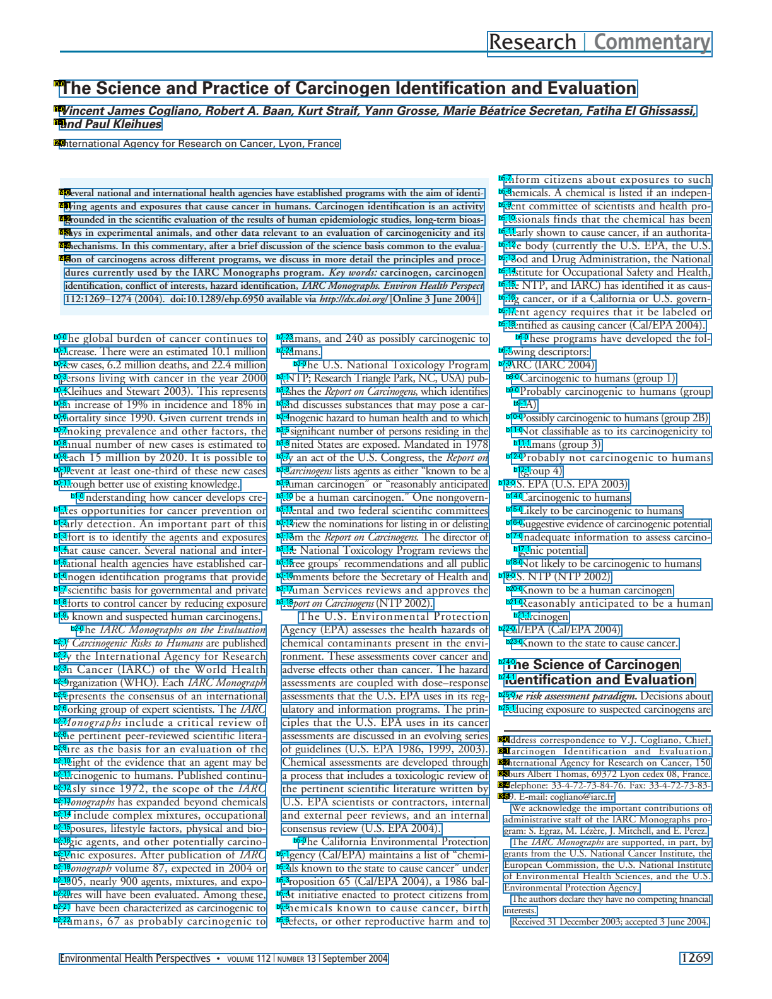

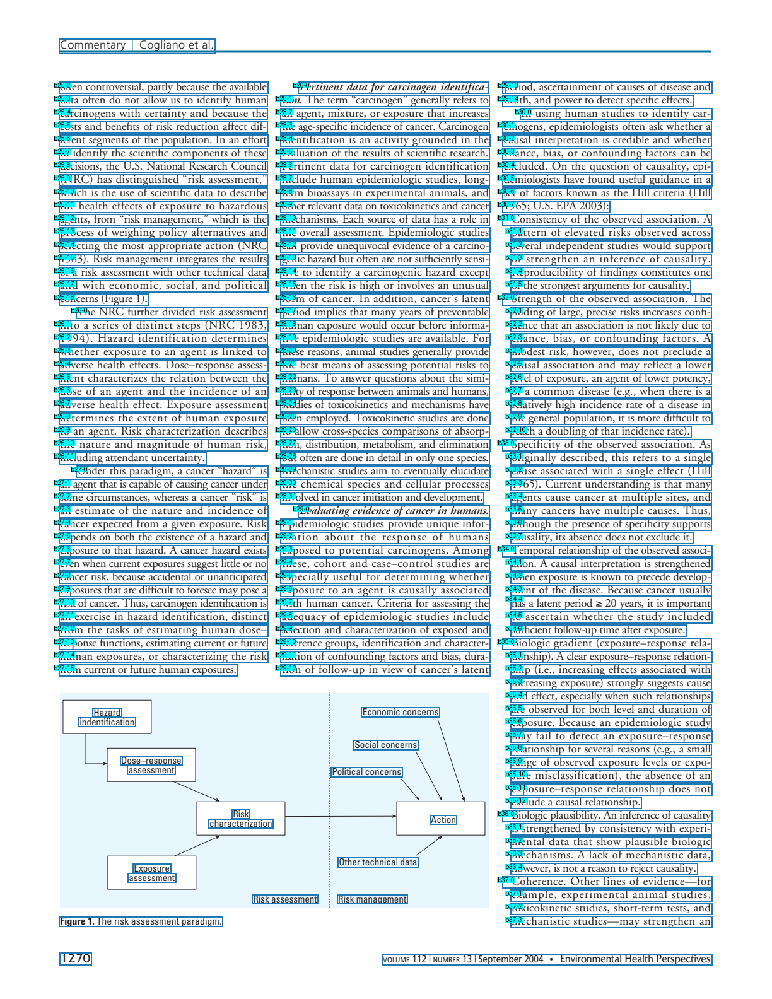

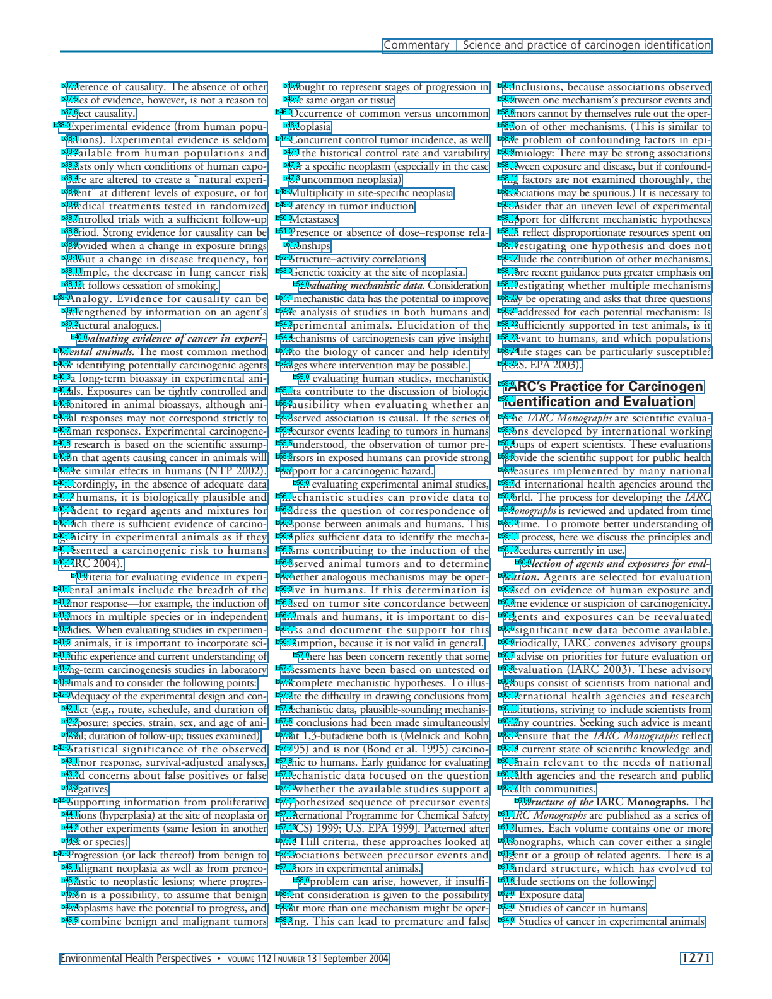

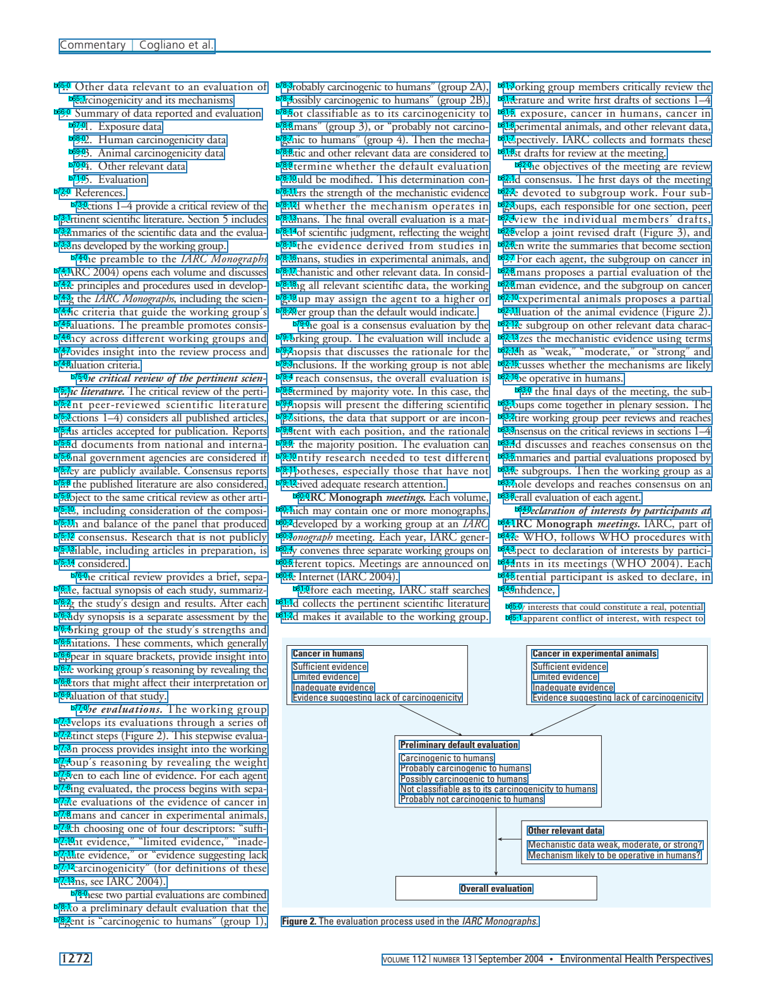

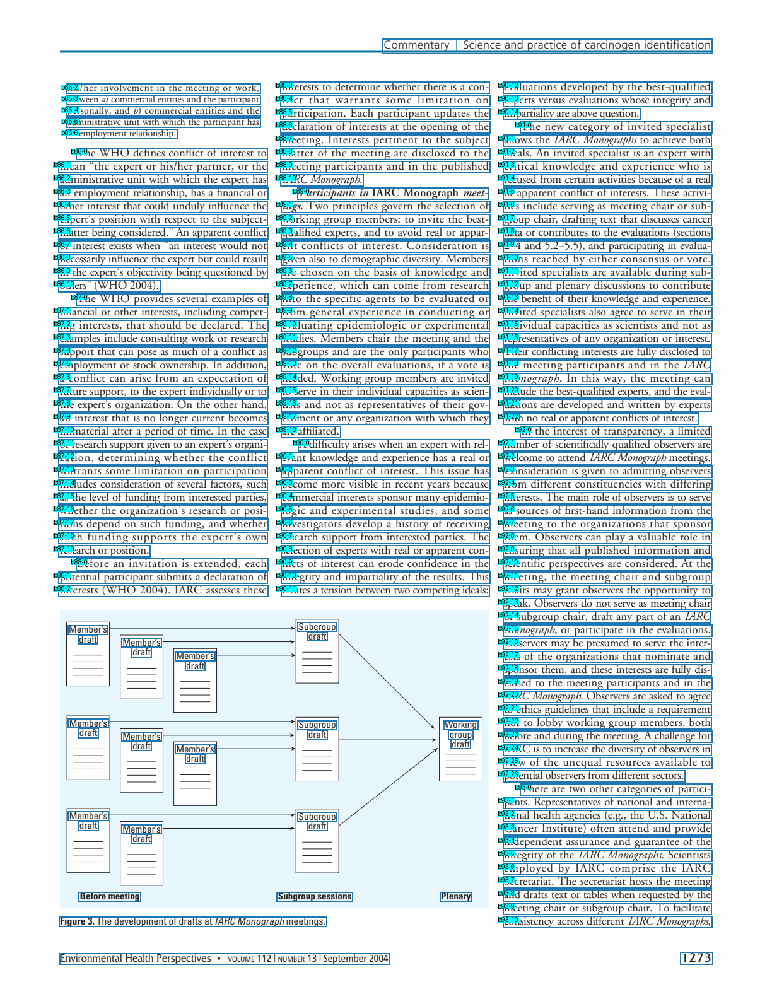

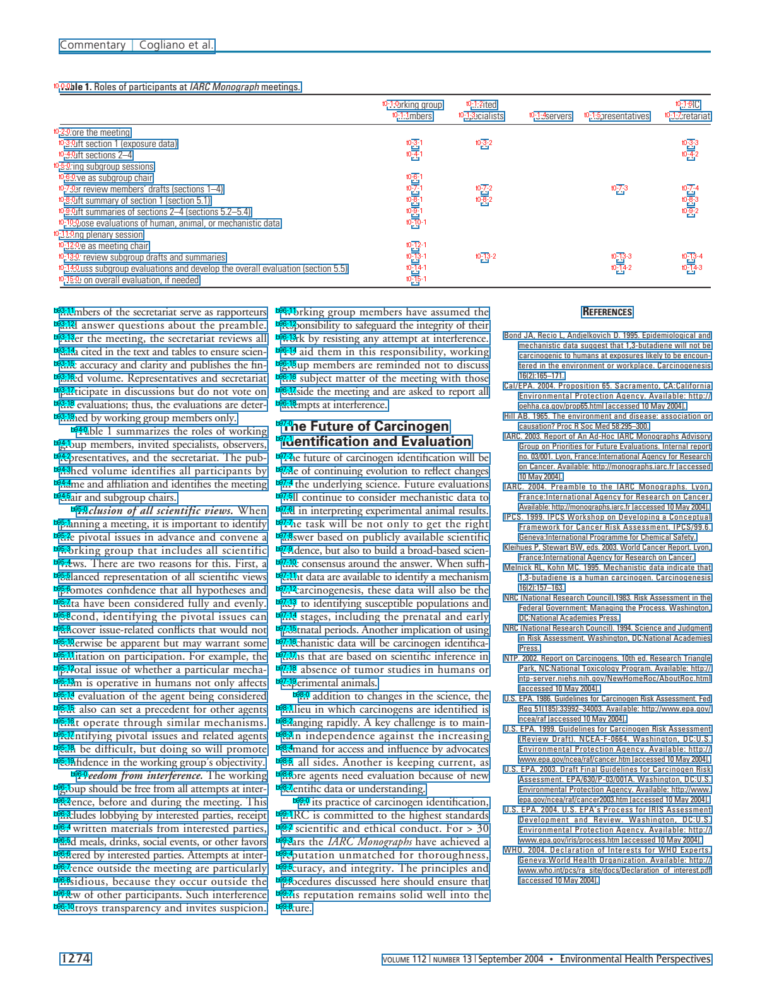

In [464]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)